In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import rdkit
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

In [2]:
RESULT_PATH = "/home/sdl/SDL-LNP/model/serverless/test/final_result.csv"

MAPPING_PATH = "/home/sdl/SDL-LNP/model/data_process/220k_library.csv"


NAME_SMI_PATH = "/home/sdl/SDL-LNP/mapping_table/General_mapping_sampler.csv"


df = pd.read_csv(RESULT_PATH)
mapping_df = pd.read_csv(MAPPING_PATH)
name_smi_df = pd.read_csv(NAME_SMI_PATH)

In [3]:
df

,smi_name,pred_result
0,CCCCCCCCC(C(=O)NCCN1CCOCC1)N(CCN(CC)CC)C(=O)CN...,1.741524
1,CCCCCCCCC(C(=O)NCCN1CCOCC1)N(CCN(CC)CC)C(=O)CN...,1.741524
2,CCCCCCCCC(C(=O)NCCN1CCOCC1)N(CCN(CC)CC)C(=O)CN...,1.579718
3,CCCCCCCCC(C(=O)NCCN1CCOCC1)N(CCN(CC)CC)C(=O)CN...,1.585119
4,CCCCCCCCC(C(=O)NCCN1CCOCC1)N(CCN(CC)CC)C(=O)CN...,1.780531
...,...,...
2433019,CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC(C)(C)CC(C)(C)...,2.176133
2433020,CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC(C)(C)CC(C)(C)...,1.721413
2433021,CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC(C)(C)CC(C)(C)...,1.492212
2433022,CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC(C)(C)CC(C)(C)...,0.683462


In [4]:
def replace_repeating_backslashes(smiles):
    # find all repeating backslashes using loop
    for i in range(2,10):
        smiles = smiles.replace("\\"*i, "\\")
    return smiles

df["smi_name"].apply(replace_repeating_backslashes)

0          CCCCCCCCC(C(=O)NCCN1CCOCC1)N(CCN(CC)CC)C(=O)CN...
1          CCCCCCCCC(C(=O)NCCN1CCOCC1)N(CCN(CC)CC)C(=O)CN...
2          CCCCCCCCC(C(=O)NCCN1CCOCC1)N(CCN(CC)CC)C(=O)CN...
3          CCCCCCCCC(C(=O)NCCN1CCOCC1)N(CCN(CC)CC)C(=O)CN...
4          CCCCCCCCC(C(=O)NCCN1CCOCC1)N(CCN(CC)CC)C(=O)CN...
                                 ...                        
2433019    CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC(C)(C)CC(C)(C)...
2433020    CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC(C)(C)CC(C)(C)...
2433021    CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC(C)(C)CC(C)(C)...
2433022    CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC(C)(C)CC(C)(C)...
2433023    CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC(C)(C)CC(C)(C)...
Name: smi_name, Length: 2433024, dtype: object

In [5]:
# get the count for each smi_name
count = df['smi_name'].value_counts() 
count

smi_name
CCCCCCCCC(C(=O)NCCN1CCOCC1)N(CCN(CC)CC)C(=O)CN(CC)CC                                                       11
CCCCCCCCCCCC(C(=O)NC12C[C@H]3C[C@@H](C1)C[C@@H](C2)C3)N(CCCN1CCOCC1)C(=O)CCCCC(=O)OC(CCC(CC)CCCC)CC(C)C    11
CCCCCCCCCCCCCCCC(=O)N(CCCN1CCOCC1)C(CCCCCCCCCCC)C(=O)NC12C[C@H]3C[C@@H](C1)C[C@@H](C2)C3                   11
CCCCCCCCCCCCCCCCCC(=O)N(CCCN1CCOCC1)C(CCCCCCCCCCC)C(=O)NC12C[C@H]3C[C@@H](C1)C[C@@H](C2)C3                 11
CCCCCCCC/C=C\CCCCCCCC(=O)N(CCCN1CCOCC1)C(CCCCCCCCCCC)C(=O)NC12C[C@H]3C[C@@H](C1)C[C@@H](C2)C3              11
                                                                                                           ..
C#CCCCCCCCCC(=O)N(CCCN1CCCC1)C(CCCCCOC(=O)C(CCCCCC)CCCCCCCC)C(=O)NCC(=O)OC                                 11
CCCCCCCCCCCC(C(=O)NC12C[C@H]3C[C@@H](C1)C[C@@H](C2)C3)N(CCCN(CCCC)CCCC)C(=O)CCCCC(=O)OC(C)CCCCCCCCC        11
CCCCCCCCCCCC(C(=O)NC12C[C@H]3C[C@@H](C1)C[C@@H](C2)C3)N(CCCN(CCCC)CCCC)C(=O)CCCCC(=O)OC(CC)CCCCCCCC        11
C

In [6]:
mapping_df

,id,combined_mol_SMILES,A_smiles,B_smiles,C_smiles,D_smiles
0,0,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CC12C[C@H]3C[C@@...,NCCN(C)C,C[N+]#[C-],CCCCCC=O,OC(CC(C1)(C2)C[C@@H]3C[C@H]2C[C@H]1C3)=O
1,1,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)C[C@@]12C[C@@H]3...,NCCN(C)C,C[N+]#[C-],CCCCCC=O,OC(C[C@@](C1)(C2)C[C@]3(O)C[C@H]2C[C@H]1C3)=O
2,2,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CCN1CCCCC1,NCCN(C)C,C[N+]#[C-],CCCCCC=O,OC(CCN1CCCCC1)=O
3,3,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CN(C)C,NCCN(C)C,C[N+]#[C-],CCCCCC=O,CN(CC(O)=O)C
4,4,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CCN(C)C,NCCN(C)C,C[N+]#[C-],CCCCCC=O,CN(CCC(O)=O)C
...,...,...,...,...,...,...
221179,221179,CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC12C[C@H]3C[C@@...,NCCCN1CCCCCC1,[C-]#[N+]C1(C[C@@H]2C3)C[C@@H]3C[C@@H](C2)C1,CCCCC/C=C\C/C=C\CCCCCCCC=O,CCCCCCCCC(OC(CCCCC(O)=O)=O)CCCCCCCC
221180,221180,CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC12C[C@H]3C[C@@...,NCCCN1CCCCCC1,[C-]#[N+]C1(C[C@@H]2C3)C[C@@H]3C[C@@H](C2)C1,CCCCC/C=C\C/C=C\CCCCCCCC=O,CCC(CCC(OC(CCCCC(O)=O)=O)CC(C)C)CCCC
221181,221181,CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC12C[C@H]3C[C@@...,NCCCN1CCCCCC1,[C-]#[N+]C1(C[C@@H]2C3)C[C@@H]3C[C@@H](C2)C1,CCCCC/C=C\C/C=C\CCCCCCCC=O,OC(CCCCC(OCCCCCCCCCC)=O)=O
221182,221182,CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC12C[C@H]3C[C@@...,NCCCN1CCCCCC1,[C-]#[N+]C1(C[C@@H]2C3)C[C@@H]3C[C@@H](C2)C1,CCCCC/C=C\C/C=C\CCCCCCCC=O,OC(CCCCC(OCCCCCCCCCCC)=O)=O


In [7]:
name_smi_df

,Motor_ID,Row,Column,Frame_ID,Tube_len,DBoard_ID,DBoard_cor,Well_cor,Reagent,Reagent Name,Reagent SMILES,Volume
0,0,NaN,NaN,NaN,NaN,0,1,NaN,NaN,NaN,NaN,NaN
1,1,A,0.0,A,60.0,1,1,A1,A1,D5616,NCCN(C)C,0.0
2,2,A,1.0,A,60.0,1,2,A3,A3,A0409,NCCCN1CCOCC1,0.0
3,3,A,2.0,A,60.0,1,3,A5,A5,D0790,NCCCN(C)C,0.0
4,4,A,3.0,A,60.0,1,4,A7,A7,A2046,NC1CCN(CC1)C,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
92,92,H,1.0,B,0.0,23,4,H4,D28,H1641+A0161,OC(CCCCC(OCC(CCCCCC)CCCCCCCC)=O)=O,0.0
93,93,H,2.0,B,0.0,24,1,H6,D30,U0028+A0161,CCC(OC(CCCCC(O)=O)=O)CCCCCCCC,0.0
94,94,H,3.0,B,0.0,24,2,H8,D32,H1401+A0161,CCCCCCCCC(OC(CCCCC(O)=O)=O)CCCCCCCC,0.0
95,95,H,4.0,B,0.0,24,3,H10,D34,D0031+A0161,OC(CCCCC(OCCCCCCCCCC)=O)=O,0.0


In [8]:
# check if all df['smi_name'] is in the mapping_df['combined_mol_SMILES']
df['smi_name'].isin(mapping_df['combined_mol_SMILES']).value_counts()

smi_name
True    2433024
Name: count, dtype: int64

## Prep

In [9]:
sns.set(style="whitegrid")

## Reduction of each molecules

In [10]:
# mean_reduce of smi_name
# mapping_df = df.groupby('smi_name').mean()

In [11]:
mapping_df

,id,combined_mol_SMILES,A_smiles,B_smiles,C_smiles,D_smiles
0,0,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CC12C[C@H]3C[C@@...,NCCN(C)C,C[N+]#[C-],CCCCCC=O,OC(CC(C1)(C2)C[C@@H]3C[C@H]2C[C@H]1C3)=O
1,1,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)C[C@@]12C[C@@H]3...,NCCN(C)C,C[N+]#[C-],CCCCCC=O,OC(C[C@@](C1)(C2)C[C@]3(O)C[C@H]2C[C@H]1C3)=O
2,2,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CCN1CCCCC1,NCCN(C)C,C[N+]#[C-],CCCCCC=O,OC(CCN1CCCCC1)=O
3,3,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CN(C)C,NCCN(C)C,C[N+]#[C-],CCCCCC=O,CN(CC(O)=O)C
4,4,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CCN(C)C,NCCN(C)C,C[N+]#[C-],CCCCCC=O,CN(CCC(O)=O)C
...,...,...,...,...,...,...
221179,221179,CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC12C[C@H]3C[C@@...,NCCCN1CCCCCC1,[C-]#[N+]C1(C[C@@H]2C3)C[C@@H]3C[C@@H](C2)C1,CCCCC/C=C\C/C=C\CCCCCCCC=O,CCCCCCCCC(OC(CCCCC(O)=O)=O)CCCCCCCC
221180,221180,CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC12C[C@H]3C[C@@...,NCCCN1CCCCCC1,[C-]#[N+]C1(C[C@@H]2C3)C[C@@H]3C[C@@H](C2)C1,CCCCC/C=C\C/C=C\CCCCCCCC=O,CCC(CCC(OC(CCCCC(O)=O)=O)CC(C)C)CCCC
221181,221181,CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC12C[C@H]3C[C@@...,NCCCN1CCCCCC1,[C-]#[N+]C1(C[C@@H]2C3)C[C@@H]3C[C@@H](C2)C1,CCCCC/C=C\C/C=C\CCCCCCCC=O,OC(CCCCC(OCCCCCCCCCC)=O)=O
221182,221182,CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC12C[C@H]3C[C@@...,NCCCN1CCCCCC1,[C-]#[N+]C1(C[C@@H]2C3)C[C@@H]3C[C@@H](C2)C1,CCCCC/C=C\C/C=C\CCCCCCCC=O,OC(CCCCC(OCCCCCCCCCCC)=O)=O


In [12]:
df

,smi_name,pred_result
0,CCCCCCCCC(C(=O)NCCN1CCOCC1)N(CCN(CC)CC)C(=O)CN...,1.741524
1,CCCCCCCCC(C(=O)NCCN1CCOCC1)N(CCN(CC)CC)C(=O)CN...,1.741524
2,CCCCCCCCC(C(=O)NCCN1CCOCC1)N(CCN(CC)CC)C(=O)CN...,1.579718
3,CCCCCCCCC(C(=O)NCCN1CCOCC1)N(CCN(CC)CC)C(=O)CN...,1.585119
4,CCCCCCCCC(C(=O)NCCN1CCOCC1)N(CCN(CC)CC)C(=O)CN...,1.780531
...,...,...
2433019,CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC(C)(C)CC(C)(C)...,2.176133
2433020,CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC(C)(C)CC(C)(C)...,1.721413
2433021,CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC(C)(C)CC(C)(C)...,1.492212
2433022,CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC(C)(C)CC(C)(C)...,0.683462


In [13]:
# find C=CCCCCCCCCC(C(=O)NCC(=O)OCC)N(C(=O)CCCCC(=O)OCCCCCCCCCCC)C1CCC(N(C)C)CC1 in df["smi_name"]

df[df["smi_name"] == "C=CCCCCCCCCC(C(=O)NCC(=O)OCC)N(C(=O)CCCCC(=O)OCCCCCCCCCCC)C1CCC(N(C)C)CC1"]

,smi_name,pred_result
1239425,C=CCCCCCCCCC(C(=O)NCC(=O)OCC)N(C(=O)CCCCC(=O)O...,3.082525
1239426,C=CCCCCCCCCC(C(=O)NCC(=O)OCC)N(C(=O)CCCCC(=O)O...,3.082525
1239427,C=CCCCCCCCCC(C(=O)NCC(=O)OCC)N(C(=O)CCCCC(=O)O...,3.535771
1239428,C=CCCCCCCCCC(C(=O)NCC(=O)OCC)N(C(=O)CCCCC(=O)O...,3.979429
1239429,C=CCCCCCCCCC(C(=O)NCC(=O)OCC)N(C(=O)CCCCC(=O)O...,3.250579
1239430,C=CCCCCCCCCC(C(=O)NCC(=O)OCC)N(C(=O)CCCCC(=O)O...,2.151898
1239431,C=CCCCCCCCCC(C(=O)NCC(=O)OCC)N(C(=O)CCCCC(=O)O...,3.759652
1239432,C=CCCCCCCCCC(C(=O)NCC(=O)OCC)N(C(=O)CCCCC(=O)O...,2.722648
1239433,C=CCCCCCCCCC(C(=O)NCC(=O)OCC)N(C(=O)CCCCC(=O)O...,2.505021
1239434,C=CCCCCCCCCC(C(=O)NCC(=O)OCC)N(C(=O)CCCCC(=O)O...,3.347163


In [14]:
# concat df and mapping_df by pairing smi_name with combined_mol_SMILES
df = pd.merge(mapping_df, df,
                     left_on='combined_mol_SMILES', right_on='smi_name', how='outer')

In [15]:
df

,id,combined_mol_SMILES,A_smiles,B_smiles,C_smiles,D_smiles,smi_name,pred_result
0,109819,C#CCCCCCCCCC(=O)N(C(C(=O)NC(C)(C)C)C(CCCCCC)CC...,CN(N)C,CC(C)([N+]#[C-])C,CCCCCCCCC(CCCCCC)C=O,OC(CCCCCCCCC#C)=O,C#CCCCCCCCCC(=O)N(C(C(=O)NC(C)(C)C)C(CCCCCC)CC...,0.268456
1,109819,C#CCCCCCCCCC(=O)N(C(C(=O)NC(C)(C)C)C(CCCCCC)CC...,CN(N)C,CC(C)([N+]#[C-])C,CCCCCCCCC(CCCCCC)C=O,OC(CCCCCCCCC#C)=O,C#CCCCCCCCCC(=O)N(C(C(=O)NC(C)(C)C)C(CCCCCC)CC...,0.268456
2,109819,C#CCCCCCCCCC(=O)N(C(C(=O)NC(C)(C)C)C(CCCCCC)CC...,CN(N)C,CC(C)([N+]#[C-])C,CCCCCCCCC(CCCCCC)C=O,OC(CCCCCCCCC#C)=O,C#CCCCCCCCCC(=O)N(C(C(=O)NC(C)(C)C)C(CCCCCC)CC...,0.203240
3,109819,C#CCCCCCCCCC(=O)N(C(C(=O)NC(C)(C)C)C(CCCCCC)CC...,CN(N)C,CC(C)([N+]#[C-])C,CCCCCCCCC(CCCCCC)C=O,OC(CCCCCCCCC#C)=O,C#CCCCCCCCCC(=O)N(C(C(=O)NC(C)(C)C)C(CCCCCC)CC...,0.667750
4,109819,C#CCCCCCCCCC(=O)N(C(C(=O)NC(C)(C)C)C(CCCCCC)CC...,CN(N)C,CC(C)([N+]#[C-])C,CCCCCCCCC(CCCCCC)C=O,OC(CCCCCCCCC#C)=O,C#CCCCCCCCCC(=O)N(C(C(=O)NC(C)(C)C)C(CCCCCC)CC...,0.595664
...,...,...,...,...,...,...,...,...
2433019,208833,CCCCCCCCCCOC(=O)CCCCC(=O)N(c1nccs1)C(CCCCCOC(=...,NC1=NC=CS1,[C-]#[N+]CN1C(C=CC=C2)=C2N=N1,O=C(C(CCCCCCCC)CCCCCC)OCCCCCC=O,OC(CCCCC(OCCCCCCCCCC)=O)=O,CCCCCCCCCCOC(=O)CCCCC(=O)N(c1nccs1)C(CCCCCOC(=...,2.125922
2433020,208833,CCCCCCCCCCOC(=O)CCCCC(=O)N(c1nccs1)C(CCCCCOC(=...,NC1=NC=CS1,[C-]#[N+]CN1C(C=CC=C2)=C2N=N1,O=C(C(CCCCCCCC)CCCCCC)OCCCCCC=O,OC(CCCCC(OCCCCCCCCCC)=O)=O,CCCCCCCCCCOC(=O)CCCCC(=O)N(c1nccs1)C(CCCCCOC(=...,2.523211
2433021,208833,CCCCCCCCCCOC(=O)CCCCC(=O)N(c1nccs1)C(CCCCCOC(=...,NC1=NC=CS1,[C-]#[N+]CN1C(C=CC=C2)=C2N=N1,O=C(C(CCCCCCCC)CCCCCC)OCCCCCC=O,OC(CCCCC(OCCCCCCCCCC)=O)=O,CCCCCCCCCCOC(=O)CCCCC(=O)N(c1nccs1)C(CCCCCOC(=...,1.579041
2433022,208833,CCCCCCCCCCOC(=O)CCCCC(=O)N(c1nccs1)C(CCCCCOC(=...,NC1=NC=CS1,[C-]#[N+]CN1C(C=CC=C2)=C2N=N1,O=C(C(CCCCCCCC)CCCCCC)OCCCCCC=O,OC(CCCCC(OCCCCCCCCCC)=O)=O,CCCCCCCCCCOC(=O)CCCCC(=O)N(c1nccs1)C(CCCCCOC(=...,2.025358


In [16]:
# get the count for each smi_name
count = df['combined_mol_SMILES'].value_counts() 
count

combined_mol_SMILES
C#CCCCCCCCCC(=O)N(C(C(=O)NC(C)(C)C)C(CCCCCC)CCCCCCCC)N(C)C                                11
CCCCCCCCCCC(C(=O)NC)N(CCCN1CCCC(CO)C1)C(=O)CCCCCCCCC                                      11
CCCCCCCCCCC(C(=O)NC)N(CCCN1CCCC(CO)C1)C(=O)CCCCBr                                         11
CCCCCCCCCCC(C(=O)NC)N(CCCN1CCCC(CO)C1)C(=O)CCCCC(=O)OC(C)CCCCCCCCC                        11
CCCCCCCCCCC(C(=O)NC)N(CCCN1CCCC(CO)C1)C(=O)CCCCC(=O)OC(CC)CCCCCCCC                        11
                                                                                          ..
CCCCCCCC/C=C\CCCCCCCC(=O)N(C(C(=O)NC(C)(C)CC(C)(C)C)C(CCCCCC)CCCCCCCC)N(C)C               11
CCCCCCCC/C=C\CCCCCCCC(=O)N(C(C(=O)NC(C)(C)CC(C)(C)C)C(CCCCCC)CCCCCCCC)N1CCCCC1            11
CCCCCCCC/C=C\CCCCCCCC(=O)N(C(C(=O)NC(C)(C)CC(C)(C)C)C(CCCCCC)CCCCCCCC)N1CCOCC1            11
CCCCCCCC/C=C\CCCCCCCC(=O)N(C(C(=O)NC)C(CCCCCC)CCCCCCCC)N(C)C                              11
CCCCCCCCCCOC(=O)CCCCC(=O)N(c1nccs1)C(CCCCCOC(=O)C(

In [17]:
count[count == 22]

Series([], Name: count, dtype: int64)

In [18]:
count[count == 1]

Series([], Name: count, dtype: int64)

In [19]:
# conver smiles component back to name
df["A_name"] = df["A_smiles"].map(name_smi_df.set_index('Reagent SMILES')['Reagent Name'])
df["B_name"] = df["B_smiles"].map(name_smi_df.set_index('Reagent SMILES')['Reagent Name'])
df["C_name"] = df["C_smiles"].map(name_smi_df.set_index('Reagent SMILES')['Reagent Name'])
df["D_name"] = df["D_smiles"].map(name_smi_df.set_index('Reagent SMILES')['Reagent Name'])

# Ploting

<Axes: ylabel='pred_result'>

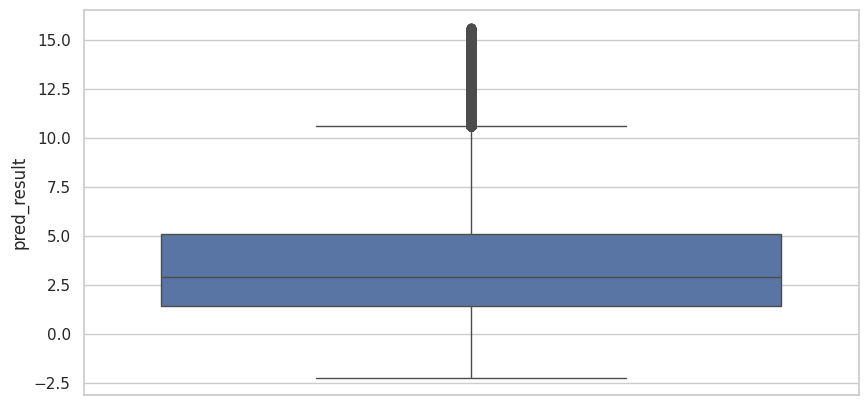

In [20]:
plt.figure(figsize=(10, 5))
sns.boxplot(y="pred_result", data=df)

<Axes: xlabel='pred_result', ylabel='Density'>

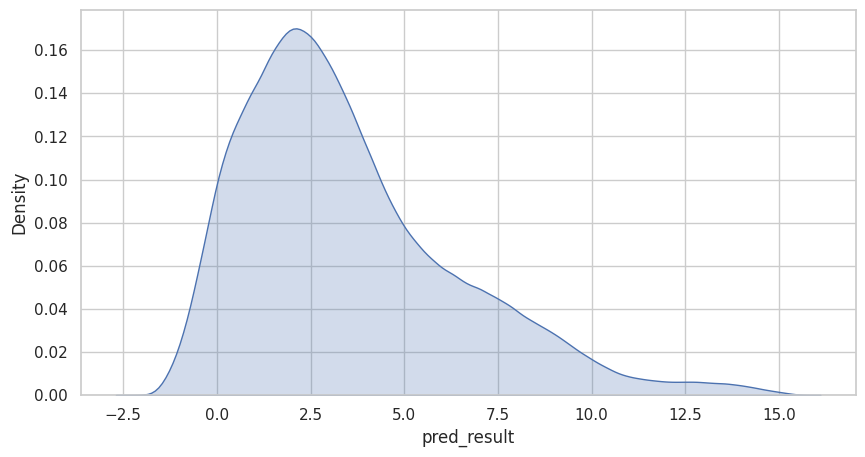

In [21]:
# density plot
plt.figure(figsize=(10, 5))
sns.kdeplot(df['pred_result'], fill=True)

# Inspect top performing molecules

In [22]:
top_10 = df.sort_values(by='pred_result', ascending=False).head(10)

In [23]:
top_10

,id,combined_mol_SMILES,A_smiles,B_smiles,C_smiles,D_smiles,smi_name,pred_result,A_name,B_name,C_name,D_name
456520,72546,CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC1CCCC1)N(CCCN(...,NCCCN(C)CCCN,[C-]#[N+]C1CCCC1,CCCCC/C=C\C/C=C\CCCCCCCC=O,OC(CN(CC)CC)=O,CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC1CCCC1)N(CCCN(...,15.641883,B0821,C2959,O0225,D0509
1043643,24137,CCCCCCCC=CC(=O)N(CCN1CCNCC1)C(CCCCCCC/C=C\CCCC...,NCCN1CCNCC1,[C-]#[N+]C1CCCC1,CCCCCCCC/C=C\CCCCCCCC=O,OC(/C=C/CCCCCCC)=O,CCCCCCCC=CC(=O)N(CCN1CCNCC1)C(CCCCCCC/C=C\CCCC...,15.613532,A0304,C2959,O0058,D0098
392101,24290,CCCCC/C=C\C/C=C\CCCCCCCC(=O)N(CCN1CCNCC1)C(CCC...,NCCN1CCNCC1,[C-]#[N+]C1CCCCC1,CCCCCCCC=O,CCCCC/C=C\C/C=C\CCCCCCCC(O)=O,CCCCC/C=C\C/C=C\CCCCCCCC(=O)N(CCN1CCNCC1)C(CCC...,15.607718,A0304,C1438,O0044,L0124
831475,69145,CCCCCCCC/C=C\CCCCCCCC(=O)N(CCCN(C)CCCN)C(CCCCC...,NCCCN(C)CCCN,C[N+]#[C-],CCCCCC=O,CCCCCCCC/C=C\CCCCCCCC(O)=O,CCCCCCCC/C=C\CCCCCCCC(=O)N(CCCN(C)CCCN)C(CCCCC...,15.595098,B0821,TRC-I289721,H0133,O0190
391821,23642,CCCCC/C=C\C/C=C\CCCCCCCC(=O)N(CCN1CCNCC1)C(CCC...,NCCN1CCNCC1,[C-]#[N+]C1CCCC1,CCCCCC=O,CCCCC/C=C\C/C=C\CCCCCCCC(O)=O,CCCCC/C=C\C/C=C\CCCCCCCC(=O)N(CCN1CCNCC1)C(CCC...,15.582740,A0304,C2959,H0133,L0124
391820,23642,CCCCC/C=C\C/C=C\CCCCCCCC(=O)N(CCN1CCNCC1)C(CCC...,NCCN1CCNCC1,[C-]#[N+]C1CCCC1,CCCCCC=O,CCCCC/C=C\C/C=C\CCCCCCCC(O)=O,CCCCC/C=C\C/C=C\CCCCCCCC(=O)N(CCN1CCNCC1)C(CCC...,15.582740,A0304,C2959,H0133,L0124
461323,24170,CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC1CCCC1)N(CCN1C...,NCCN1CCNCC1,[C-]#[N+]C1CCCC1,CCCCC/C=C\C/C=C\CCCCCCCC=O,OC(CCCCCCCC)=O,CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC1CCCC1)N(CCN1C...,15.570146,A0304,C2959,O0225,P0952
461166,24171,CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC1CCCC1)N(CCN1C...,NCCN1CCNCC1,[C-]#[N+]C1CCCC1,CCCCC/C=C\C/C=C\CCCCCCCC=O,CC(CCC(O)=O)CCCCC,CCCCC/C=C\C/C=C\CCCCCCCC(C(=O)NC1CCCC1)N(CCN1C...,15.563772,A0304,C2959,O0225,M2380
857524,23677,CCCCCCCC/C=C\CCCCCCCC(=O)N(CCN1CCNCC1)C(CCCCCC...,NCCN1CCNCC1,[C-]#[N+]C1CCCC1,CCCCCCC=O,CCCCCCCC/C=C\CCCCCCCC(O)=O,CCCCCCCC/C=C\CCCCCCCC(=O)N(CCN1CCNCC1)C(CCCCCC...,15.562003,A0304,C2959,H0025,O0190
391914,20798,CCCCC/C=C\C/C=C\CCCCCCCC(=O)N(CCN1CCNCC1)C(CCC...,NCCN1CCNCC1,C[N+]#[C-],CCCCCCC=O,CCCCC/C=C\C/C=C\CCCCCCCC(O)=O,CCCCC/C=C\C/C=C\CCCCCCCC(=O)N(CCN1CCNCC1)C(CCC...,15.561385,A0304,TRC-I289721,H0025,L0124


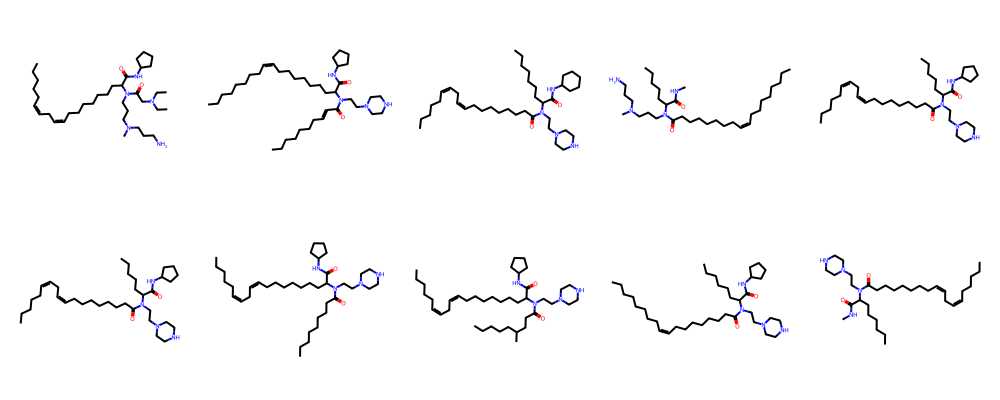

In [24]:
# visualize top 10 with chemdraw
rdkit.Chem.Draw.MolsToGridImage([rdkit.Chem.MolFromSmiles(smi) for smi in top_10["combined_mol_SMILES"]], molsPerRow=5, subImgSize=(200, 200))

In [26]:
df

,id,combined_mol_SMILES,A_smiles,B_smiles,C_smiles,D_smiles,smi_name,pred_result,A_name,B_name,C_name,D_name
0,109819,C#CCCCCCCCCC(=O)N(C(C(=O)NC(C)(C)C)C(CCCCCC)CC...,CN(N)C,CC(C)([N+]#[C-])C,CCCCCCCCC(CCCCCC)C=O,OC(CCCCCCCCC#C)=O,C#CCCCCCCCCC(=O)N(C(C(=O)NC(C)(C)C)C(CCCCCC)CC...,0.268456,D0742,B1274,H1461,U0054
1,109819,C#CCCCCCCCCC(=O)N(C(C(=O)NC(C)(C)C)C(CCCCCC)CC...,CN(N)C,CC(C)([N+]#[C-])C,CCCCCCCCC(CCCCCC)C=O,OC(CCCCCCCCC#C)=O,C#CCCCCCCCCC(=O)N(C(C(=O)NC(C)(C)C)C(CCCCCC)CC...,0.268456,D0742,B1274,H1461,U0054
2,109819,C#CCCCCCCCCC(=O)N(C(C(=O)NC(C)(C)C)C(CCCCCC)CC...,CN(N)C,CC(C)([N+]#[C-])C,CCCCCCCCC(CCCCCC)C=O,OC(CCCCCCCCC#C)=O,C#CCCCCCCCCC(=O)N(C(C(=O)NC(C)(C)C)C(CCCCCC)CC...,0.203240,D0742,B1274,H1461,U0054
3,109819,C#CCCCCCCCCC(=O)N(C(C(=O)NC(C)(C)C)C(CCCCCC)CC...,CN(N)C,CC(C)([N+]#[C-])C,CCCCCCCCC(CCCCCC)C=O,OC(CCCCCCCCC#C)=O,C#CCCCCCCCCC(=O)N(C(C(=O)NC(C)(C)C)C(CCCCCC)CC...,0.667750,D0742,B1274,H1461,U0054
4,109819,C#CCCCCCCCCC(=O)N(C(C(=O)NC(C)(C)C)C(CCCCCC)CC...,CN(N)C,CC(C)([N+]#[C-])C,CCCCCCCCC(CCCCCC)C=O,OC(CCCCCCCCC#C)=O,C#CCCCCCCCCC(=O)N(C(C(=O)NC(C)(C)C)C(CCCCCC)CC...,0.595664,D0742,B1274,H1461,U0054
...,...,...,...,...,...,...,...,...,...,...,...,...
2433019,208833,CCCCCCCCCCOC(=O)CCCCC(=O)N(c1nccs1)C(CCCCCOC(=...,NC1=NC=CS1,[C-]#[N+]CN1C(C=CC=C2)=C2N=N1,O=C(C(CCCCCCCC)CCCCCC)OCCCCCC=O,OC(CCCCC(OCCCCCCCCCC)=O)=O,CCCCCCCCCCOC(=O)CCCCC(=O)N(c1nccs1)C(CCCCCOC(=...,2.125922,123129,I0455,2-butyloctanoic acid,D0031+A0161
2433020,208833,CCCCCCCCCCOC(=O)CCCCC(=O)N(c1nccs1)C(CCCCCOC(=...,NC1=NC=CS1,[C-]#[N+]CN1C(C=CC=C2)=C2N=N1,O=C(C(CCCCCCCC)CCCCCC)OCCCCCC=O,OC(CCCCC(OCCCCCCCCCC)=O)=O,CCCCCCCCCCOC(=O)CCCCC(=O)N(c1nccs1)C(CCCCCOC(=...,2.523211,123129,I0455,2-butyloctanoic acid,D0031+A0161
2433021,208833,CCCCCCCCCCOC(=O)CCCCC(=O)N(c1nccs1)C(CCCCCOC(=...,NC1=NC=CS1,[C-]#[N+]CN1C(C=CC=C2)=C2N=N1,O=C(C(CCCCCCCC)CCCCCC)OCCCCCC=O,OC(CCCCC(OCCCCCCCCCC)=O)=O,CCCCCCCCCCOC(=O)CCCCC(=O)N(c1nccs1)C(CCCCCOC(=...,1.579041,123129,I0455,2-butyloctanoic acid,D0031+A0161
2433022,208833,CCCCCCCCCCOC(=O)CCCCC(=O)N(c1nccs1)C(CCCCCOC(=...,NC1=NC=CS1,[C-]#[N+]CN1C(C=CC=C2)=C2N=N1,O=C(C(CCCCCCCC)CCCCCC)OCCCCCC=O,OC(CCCCC(OCCCCCCCCCC)=O)=O,CCCCCCCCCCOC(=O)CCCCC(=O)N(c1nccs1)C(CCCCCOC(=...,2.025358,123129,I0455,2-butyloctanoic acid,D0031+A0161


In [25]:
# fileter out top 10 performing A molecules
A_ranking = df.groupby('A_smiles').mean().sort_values(by='pred_result', ascending=False)
# map index to name
A_ranking['A_name'] = A_ranking.index.map(name_smi_df.set_index('Reagent SMILES')['Reagent Name'])
rdkit.Chem.Draw.MolsToGridImage([rdkit.Chem.MolFromSmiles(smi) for smi in A_ranking.head(10).index], molsPerRow=5, subImgSize=(200, 200), legends=[name for name in A_ranking.head(10)['A_name']])

TypeError: agg function failed [how->mean,dtype->object]

<Axes: xlabel='A_name', ylabel='pred_result'>

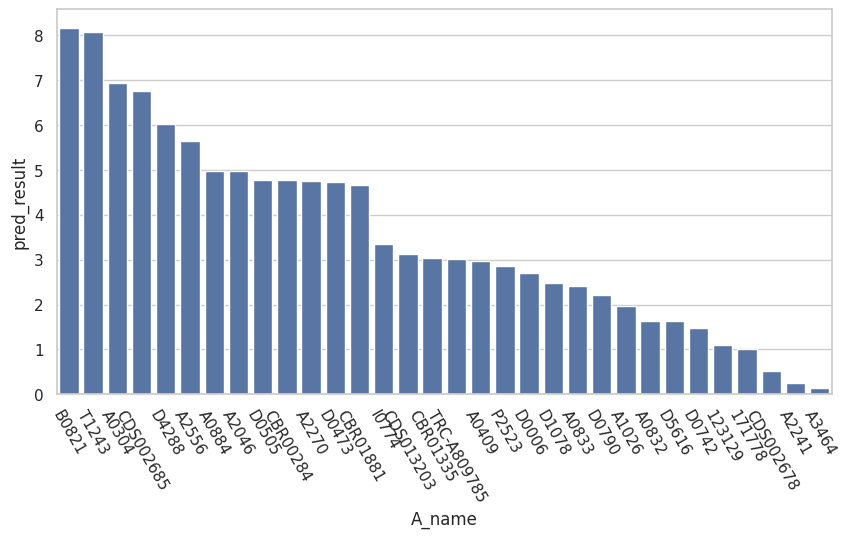

In [ ]:
# plot result distribution of A molecules
plt.figure(figsize=(10, 5))
# using bar, make the label readable (tilt)
plt.xticks(rotation=-60)
sns.barplot(x=A_ranking["A_name"], y=A_ranking['pred_result'],)


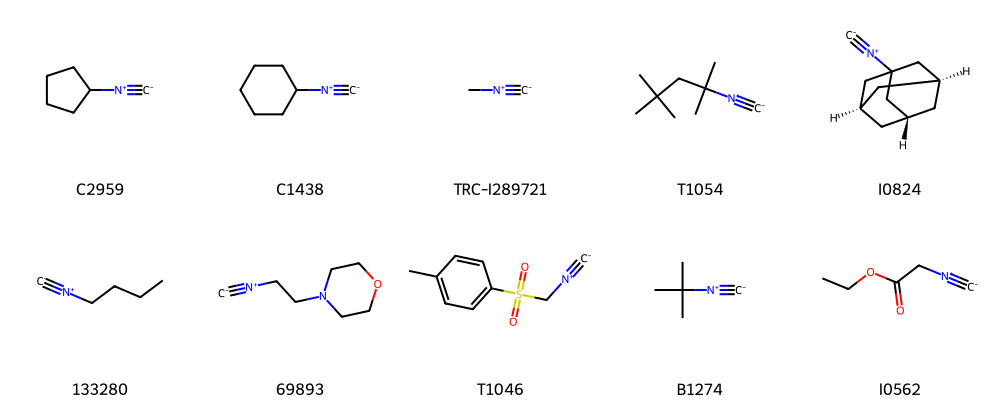

In [ ]:
# fileter out top 10 unique B_smiles
B_ranking = df.groupby('B_smiles').mean().sort_values(by='pred_result', ascending=False).head(10)
B_ranking['B_name'] = B_ranking.index.map(name_smi_df.set_index('Reagent SMILES')['Reagent Name'])
rdkit.Chem.Draw.MolsToGridImage([rdkit.Chem.MolFromSmiles(smi) for smi in B_ranking.index], molsPerRow=5, subImgSize=(200, 200), legends=[name for name in B_ranking['B_name']])

<Axes: xlabel='B_name', ylabel='pred_result'>

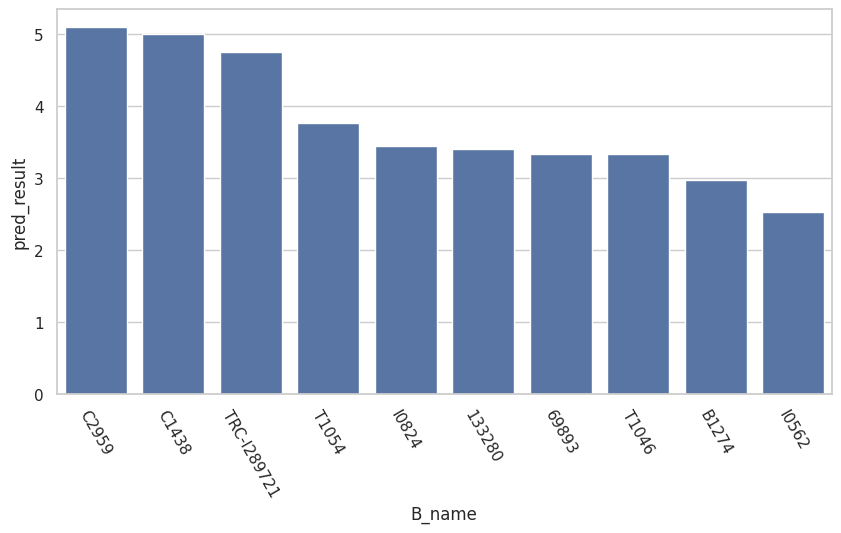

In [ ]:
# plot result distribution of B molecules
plt.figure(figsize=(10, 5))
# using bar, make the label readable (tilt)?
plt.xticks(rotation=-60)
sns.barplot(x=B_ranking["B_name"], y=B_ranking['pred_result'])

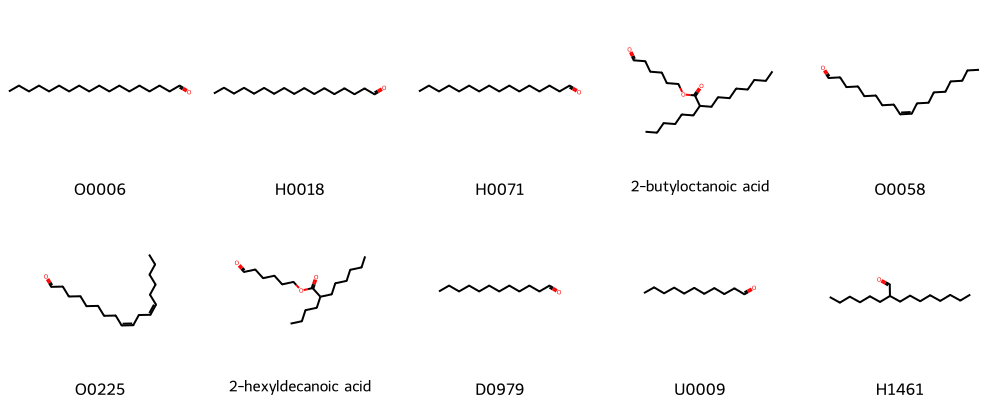

In [ ]:
# fileter out top 10 unique C_smiles
C_ranking = df.groupby('C_smiles').mean().sort_values(by='pred_result', ascending=False).head(10)
C_ranking['C_name'] = C_ranking.index.map(name_smi_df.set_index('Reagent SMILES')['Reagent Name'])
rdkit.Chem.Draw.MolsToGridImage([rdkit.Chem.MolFromSmiles(smi) for smi in C_ranking.index], molsPerRow=5, subImgSize=(200, 200), legends=[name for name in C_ranking['C_name']])

<Axes: xlabel='C_name', ylabel='pred_result'>

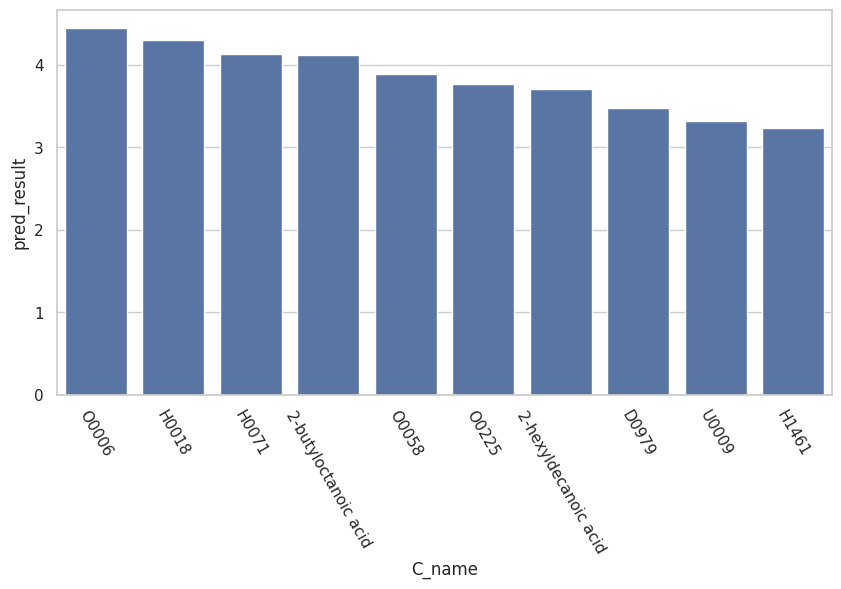

In [ ]:
# plot result distribution of C molecules
plt.figure(figsize=(10, 5))
# using bar, make the label readable (tilt)?
plt.xticks(rotation=-60)
sns.barplot(x=C_ranking["C_name"], y=C_ranking['pred_result'])

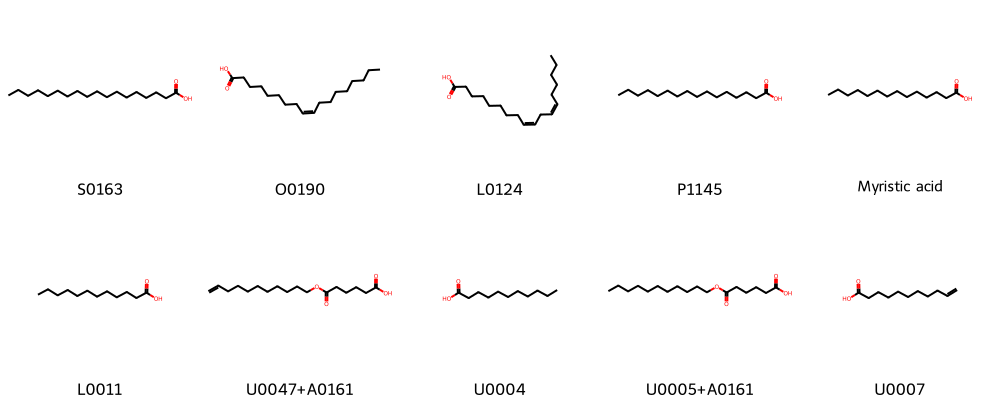

In [ ]:
# D molecules
D_ranking = df.groupby('D_smiles').mean().sort_values(by='pred_result', ascending=False).head(10)
D_ranking['D_name'] = D_ranking.index.map(name_smi_df.set_index('Reagent SMILES')['Reagent Name'])
rdkit.Chem.Draw.MolsToGridImage([rdkit.Chem.MolFromSmiles(smi) for smi in D_ranking.index], molsPerRow=5, subImgSize=(200, 200), legends=[name for name in D_ranking['D_name']])

<Axes: xlabel='D_name', ylabel='pred_result'>

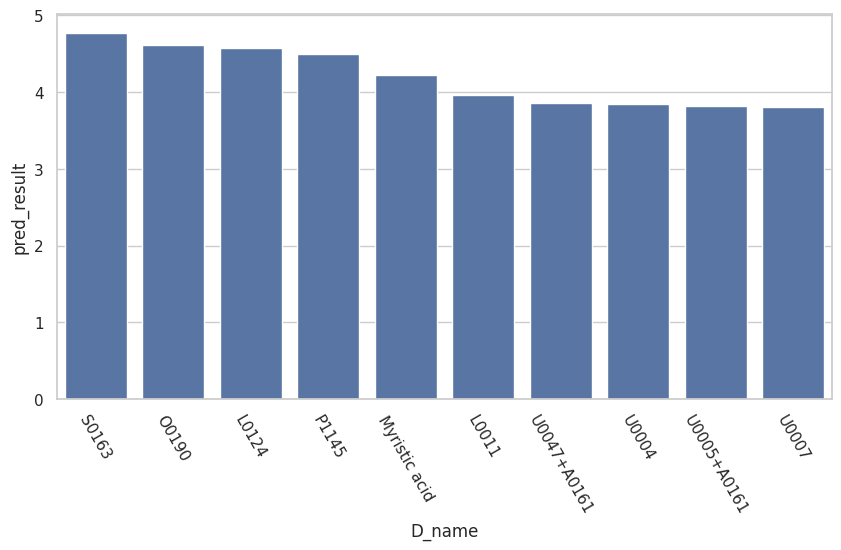

In [ ]:
# plot result distribution of D molecules
plt.figure(figsize=(10, 5))
# using bar, make the label readable (tilt)?
plt.xticks(rotation=-60)
sns.barplot(x=D_ranking["D_name"], y=D_ranking['pred_result'])

In [ ]:
df

,id,combined_mol_SMILES,A_smiles,B_smiles,C_smiles,D_smiles,smi_name,pred_result,A_name,B_name,C_name,D_name
0,0,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CC12C[C@H]3C[C@@...,NCCN(C)C,C[N+]#[C-],CCCCCC=O,OC(CC(C1)(C2)C[C@@H]3C[C@H]2C[C@H]1C3)=O,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CC12C[C@H]3C[C@@...,0.043650,D5616,TRC-I289721,H0133,A0736
1,0,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CC12C[C@H]3C[C@@...,NCCN(C)C,C[N+]#[C-],CCCCCC=O,OC(CC(C1)(C2)C[C@@H]3C[C@H]2C[C@H]1C3)=O,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CC12C[C@H]3C[C@@...,0.043650,D5616,TRC-I289721,H0133,A0736
2,0,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CC12C[C@H]3C[C@@...,NCCN(C)C,C[N+]#[C-],CCCCCC=O,OC(CC(C1)(C2)C[C@@H]3C[C@H]2C[C@H]1C3)=O,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CC12C[C@H]3C[C@@...,-0.216399,D5616,TRC-I289721,H0133,A0736
3,0,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CC12C[C@H]3C[C@@...,NCCN(C)C,C[N+]#[C-],CCCCCC=O,OC(CC(C1)(C2)C[C@@H]3C[C@H]2C[C@H]1C3)=O,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CC12C[C@H]3C[C@@...,0.405332,D5616,TRC-I289721,H0133,A0736
4,0,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CC12C[C@H]3C[C@@...,NCCN(C)C,C[N+]#[C-],CCCCCC=O,OC(CC(C1)(C2)C[C@@H]3C[C@H]2C[C@H]1C3)=O,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CC12C[C@H]3C[C@@...,-0.365024,D5616,TRC-I289721,H0133,A0736
...,...,...,...,...,...,...,...,...,...,...,...,...
2433019,221183,C=CCCCCCCCCCOC(=O)CCCCC(=O)N(CCCN1CCCCCC1)C(CC...,NCCCN1CCCCCC1,[C-]#[N+]C1(C[C@@H]2C3)C[C@@H]3C[C@@H](C2)C1,CCCCC/C=C\C/C=C\CCCCCCCC=O,OC(CCCCC(OCCCCCCCCCC=C)=O)=O,C=CCCCCCCCCCOC(=O)CCCCC(=O)N(CCCN1CCCCCC1)C(CC...,2.809556,TRC-A809785,I0824,O0225,U0047+A0161
2433020,221183,C=CCCCCCCCCCOC(=O)CCCCC(=O)N(CCCN1CCCCCC1)C(CC...,NCCCN1CCCCCC1,[C-]#[N+]C1(C[C@@H]2C3)C[C@@H]3C[C@@H](C2)C1,CCCCC/C=C\C/C=C\CCCCCCCC=O,OC(CCCCC(OCCCCCCCCCC=C)=O)=O,C=CCCCCCCCCCOC(=O)CCCCC(=O)N(CCCN1CCCCCC1)C(CC...,2.691657,TRC-A809785,I0824,O0225,U0047+A0161
2433021,221183,C=CCCCCCCCCCOC(=O)CCCCC(=O)N(CCCN1CCCCCC1)C(CC...,NCCCN1CCCCCC1,[C-]#[N+]C1(C[C@@H]2C3)C[C@@H]3C[C@@H](C2)C1,CCCCC/C=C\C/C=C\CCCCCCCC=O,OC(CCCCC(OCCCCCCCCCC=C)=O)=O,C=CCCCCCCCCCOC(=O)CCCCC(=O)N(CCCN1CCCCCC1)C(CC...,1.569981,TRC-A809785,I0824,O0225,U0047+A0161
2433022,221183,C=CCCCCCCCCCOC(=O)CCCCC(=O)N(CCCN1CCCCCC1)C(CC...,NCCCN1CCCCCC1,[C-]#[N+]C1(C[C@@H]2C3)C[C@@H]3C[C@@H](C2)C1,CCCCC/C=C\C/C=C\CCCCCCCC=O,OC(CCCCC(OCCCCCCCCCC=C)=O)=O,C=CCCCCCCCCCOC(=O)CCCCC(=O)N(CCCN1CCCCCC1)C(CC...,1.481399,TRC-A809785,I0824,O0225,U0047+A0161


In [ ]:
df

,id,combined_mol_SMILES,A_smiles,B_smiles,C_smiles,D_smiles,smi_name,pred_result,A_name,B_name,C_name,D_name
0,0,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CC12C[C@H]3C[C@@...,NCCN(C)C,C[N+]#[C-],CCCCCC=O,OC(CC(C1)(C2)C[C@@H]3C[C@H]2C[C@H]1C3)=O,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CC12C[C@H]3C[C@@...,0.043650,D5616,TRC-I289721,H0133,A0736
1,0,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CC12C[C@H]3C[C@@...,NCCN(C)C,C[N+]#[C-],CCCCCC=O,OC(CC(C1)(C2)C[C@@H]3C[C@H]2C[C@H]1C3)=O,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CC12C[C@H]3C[C@@...,0.043650,D5616,TRC-I289721,H0133,A0736
2,0,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CC12C[C@H]3C[C@@...,NCCN(C)C,C[N+]#[C-],CCCCCC=O,OC(CC(C1)(C2)C[C@@H]3C[C@H]2C[C@H]1C3)=O,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CC12C[C@H]3C[C@@...,-0.216399,D5616,TRC-I289721,H0133,A0736
3,0,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CC12C[C@H]3C[C@@...,NCCN(C)C,C[N+]#[C-],CCCCCC=O,OC(CC(C1)(C2)C[C@@H]3C[C@H]2C[C@H]1C3)=O,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CC12C[C@H]3C[C@@...,0.405332,D5616,TRC-I289721,H0133,A0736
4,0,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CC12C[C@H]3C[C@@...,NCCN(C)C,C[N+]#[C-],CCCCCC=O,OC(CC(C1)(C2)C[C@@H]3C[C@H]2C[C@H]1C3)=O,CCCCCC(C(=O)NC)N(CCN(C)C)C(=O)CC12C[C@H]3C[C@@...,-0.365024,D5616,TRC-I289721,H0133,A0736
...,...,...,...,...,...,...,...,...,...,...,...,...
2433019,221183,C=CCCCCCCCCCOC(=O)CCCCC(=O)N(CCCN1CCCCCC1)C(CC...,NCCCN1CCCCCC1,[C-]#[N+]C1(C[C@@H]2C3)C[C@@H]3C[C@@H](C2)C1,CCCCC/C=C\C/C=C\CCCCCCCC=O,OC(CCCCC(OCCCCCCCCCC=C)=O)=O,C=CCCCCCCCCCOC(=O)CCCCC(=O)N(CCCN1CCCCCC1)C(CC...,2.809556,TRC-A809785,I0824,O0225,U0047+A0161
2433020,221183,C=CCCCCCCCCCOC(=O)CCCCC(=O)N(CCCN1CCCCCC1)C(CC...,NCCCN1CCCCCC1,[C-]#[N+]C1(C[C@@H]2C3)C[C@@H]3C[C@@H](C2)C1,CCCCC/C=C\C/C=C\CCCCCCCC=O,OC(CCCCC(OCCCCCCCCCC=C)=O)=O,C=CCCCCCCCCCOC(=O)CCCCC(=O)N(CCCN1CCCCCC1)C(CC...,2.691657,TRC-A809785,I0824,O0225,U0047+A0161
2433021,221183,C=CCCCCCCCCCOC(=O)CCCCC(=O)N(CCCN1CCCCCC1)C(CC...,NCCCN1CCCCCC1,[C-]#[N+]C1(C[C@@H]2C3)C[C@@H]3C[C@@H](C2)C1,CCCCC/C=C\C/C=C\CCCCCCCC=O,OC(CCCCC(OCCCCCCCCCC=C)=O)=O,C=CCCCCCCCCCOC(=O)CCCCC(=O)N(CCCN1CCCCCC1)C(CC...,1.569981,TRC-A809785,I0824,O0225,U0047+A0161
2433022,221183,C=CCCCCCCCCCOC(=O)CCCCC(=O)N(CCCN1CCCCCC1)C(CC...,NCCCN1CCCCCC1,[C-]#[N+]C1(C[C@@H]2C3)C[C@@H]3C[C@@H](C2)C1,CCCCC/C=C\C/C=C\CCCCCCCC=O,OC(CCCCC(OCCCCCCCCCC=C)=O)=O,C=CCCCCCCCCCOC(=O)CCCCC(=O)N(CCCN1CCCCCC1)C(CC...,1.481399,TRC-A809785,I0824,O0225,U0047+A0161


In [28]:


# Example data
# plot_df = df[:10000]
# randomly sample 100000  data
plot_df = df.sample(n=10000)

# convert plot_df A_name, B_name, C_name, D_name to int code
plot_df["A_code"] = plot_df["A_name"].astype('category').cat.codes
plot_df["B_code"] = plot_df["B_name"].astype('category').cat.codes
plot_df["C_code"] = plot_df["C_name"].astype('category').cat.codes
plot_df["D_code"] = plot_df["D_name"].astype('category').cat.codes


# Calculate average 'pred_result' for each category
a_avg = plot_df.groupby('A_name')['pred_result'].mean().sort_values()
b_avg = plot_df.groupby('B_name')['pred_result'].mean().sort_values()
c_avg = plot_df.groupby('C_name')['pred_result'].mean().sort_values()
d_avg = plot_df.groupby('D_name')['pred_result'].mean().sort_values()

# Map the sorted categories to their codes
a_map = {name: code for code, name in enumerate(a_avg.index)}
b_map = {name: code for code, name in enumerate(b_avg.index)}
c_map = {name: code for code, name in enumerate(c_avg.index)}
d_map = {name: code for code, name in enumerate(d_avg.index)}

# Update the codes in plot_df
plot_df["A_code"] = plot_df["A_name"].map(a_map)
plot_df["B_code"] = plot_df["B_name"].map(b_map)
plot_df["C_code"] = plot_df["C_name"].map(c_map)
plot_df["D_code"] = plot_df["D_name"].map(d_map)


# Create figure
fig = go.Figure(data=
    go.Parcoords(
        line = dict(color = plot_df['pred_result'],
                    showscale = True,
                    colorscale = 'Electric',
                    ),
        dimensions = list([
            dict(
                label = 'A_code', 
                tickvals = plot_df["A_name"].astype('category').cat.codes.unique(),
                values = plot_df['A_code'].values,
                ticktext = plot_df["A_name"].astype('category').cat.categories.tolist()
                ),
            dict(
                label = 'B_code', 
                tickvals = plot_df["B_name"].astype('category').cat.codes.unique(),
                values = plot_df['B_code'].values,
                ticktext = plot_df["B_name"].astype('category').cat.categories.tolist()
                ),
            dict(
                label = 'C_code',
                tickvals = plot_df["C_name"].astype('category').cat.codes.unique(),
                values = plot_df['C_code'].values,
                ticktext = plot_df["C_name"].astype('category').cat.categories.tolist()
                ),
            dict(
                label = 'D_code', 
                tickvals = plot_df["D_name"].astype('category').cat.codes.unique(),
                values = plot_df['D_code'].values,
                ticktext = plot_df["D_name"].astype('category').cat.categories.tolist()
                ),
            dict(range = [plot_df['pred_result'].min()-1, plot_df['pred_result'].max()+1],
                label = 'pred_result', 
                values = plot_df['pred_result'])
        ]),
    )
)
        
        

fig.show()


<Figure size 1000x1000 with 0 Axes>

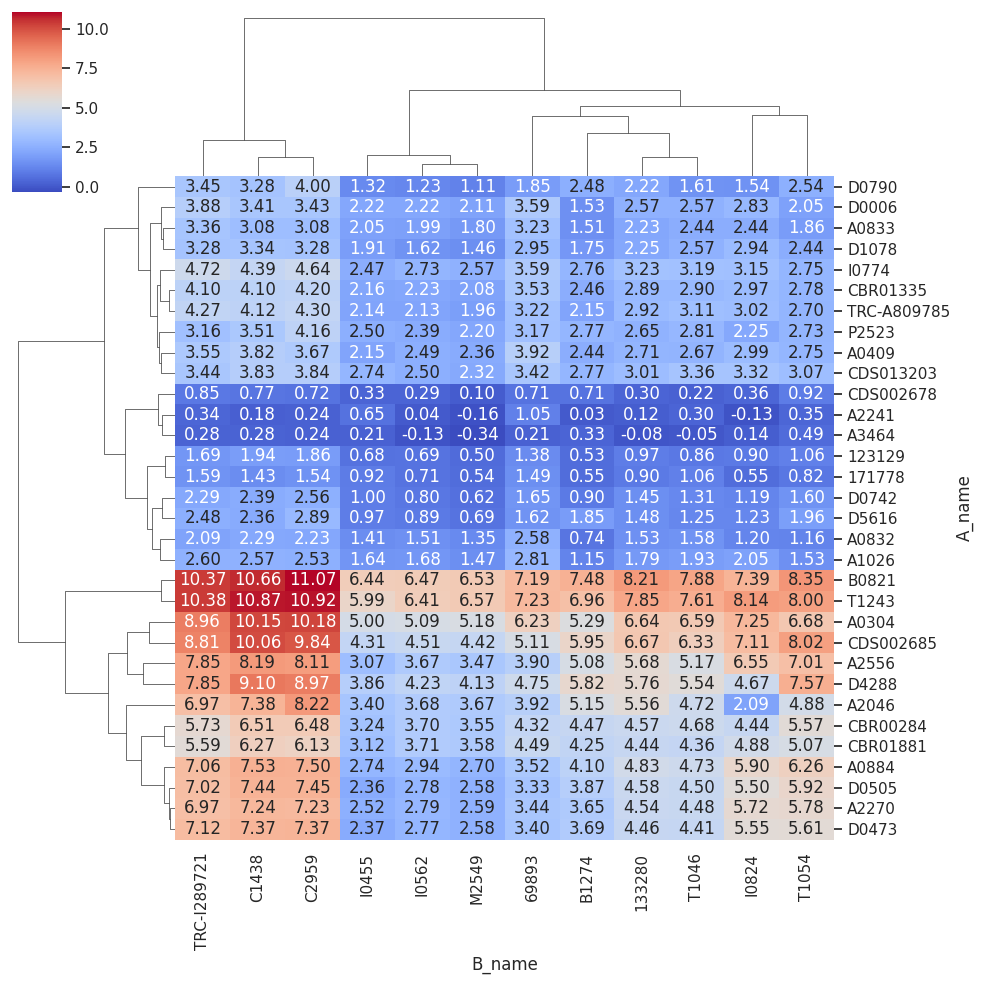

In [ ]:
# make a matrix that compares the correlation between AxB, using mean or median reduction

def compute_matrix(class_A = "A", class_B = "B", method = "mean"):
    # filter out A and B molecules
    if method == "mean":
        AxB = df.groupby([f'{class_A}_name', f'{class_B}_name']).mean().drop(columns=['id'])
    elif method == "median":
        AxB = df.groupby([f'{class_A}_name', f'{class_B}_name']).median().drop(columns=['id'])
    elif method == "variation":
        AxB = df.groupby([f'{class_A}_name', f'{class_B}_name']).std().drop(columns=['id'])
    else:
        raise ValueError("method should be either mean, median, or variation")
    # convert AxB to matrix
    AxB = AxB['pred_result']
    AxB_matrix = AxB.unstack()
    return AxB_matrix

AxB_matrix = compute_matrix("A", "B", "mean")

# plot the matrix
plt.figure(figsize=(10, 10))
# sns.heatmap(AxB_matrix, annot=True, fmt=".2f", cmap='coolwarm')

sns.clustermap(AxB_matrix, annot=True, fmt=".2f", cmap='coolwarm')
    

<Figure size 1000x1000 with 0 Axes>

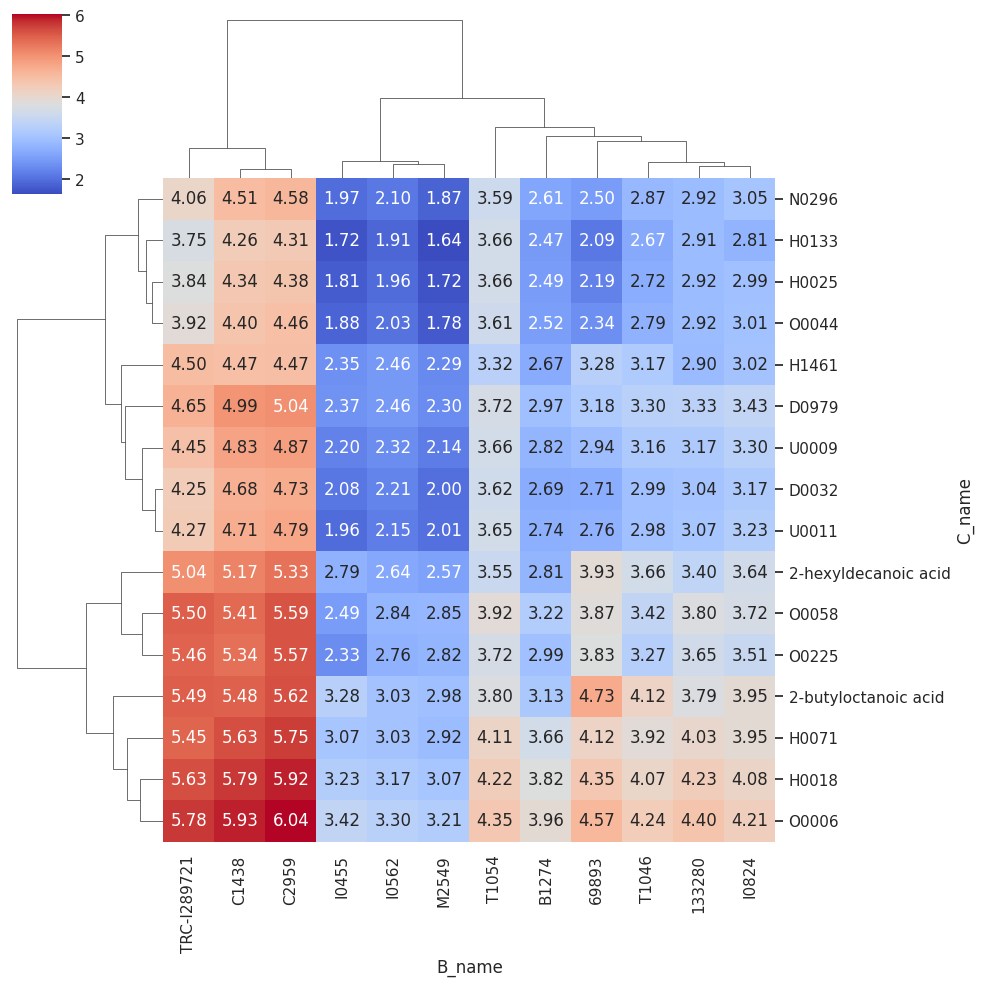

In [ ]:
plt.figure(figsize=(10, 10))
sns.clustermap(compute_matrix("C", "B", "mean"), annot=True, fmt=".2f", cmap='coolwarm')

<Figure size 1000x1000 with 0 Axes>

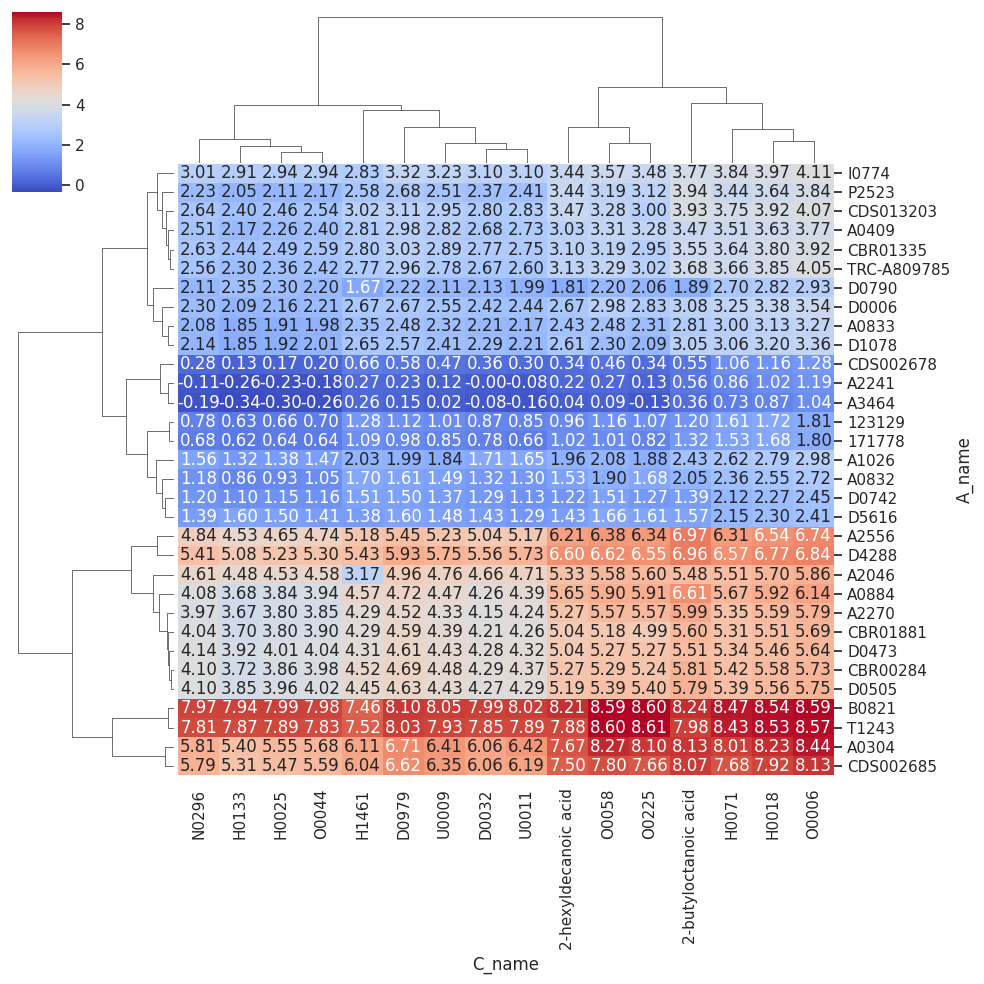

In [ ]:
plt.figure(figsize=(10, 10))
sns.clustermap(compute_matrix("A", "C", "mean"), annot=True, fmt=".2f", cmap='coolwarm')

<Figure size 1000x1000 with 0 Axes>

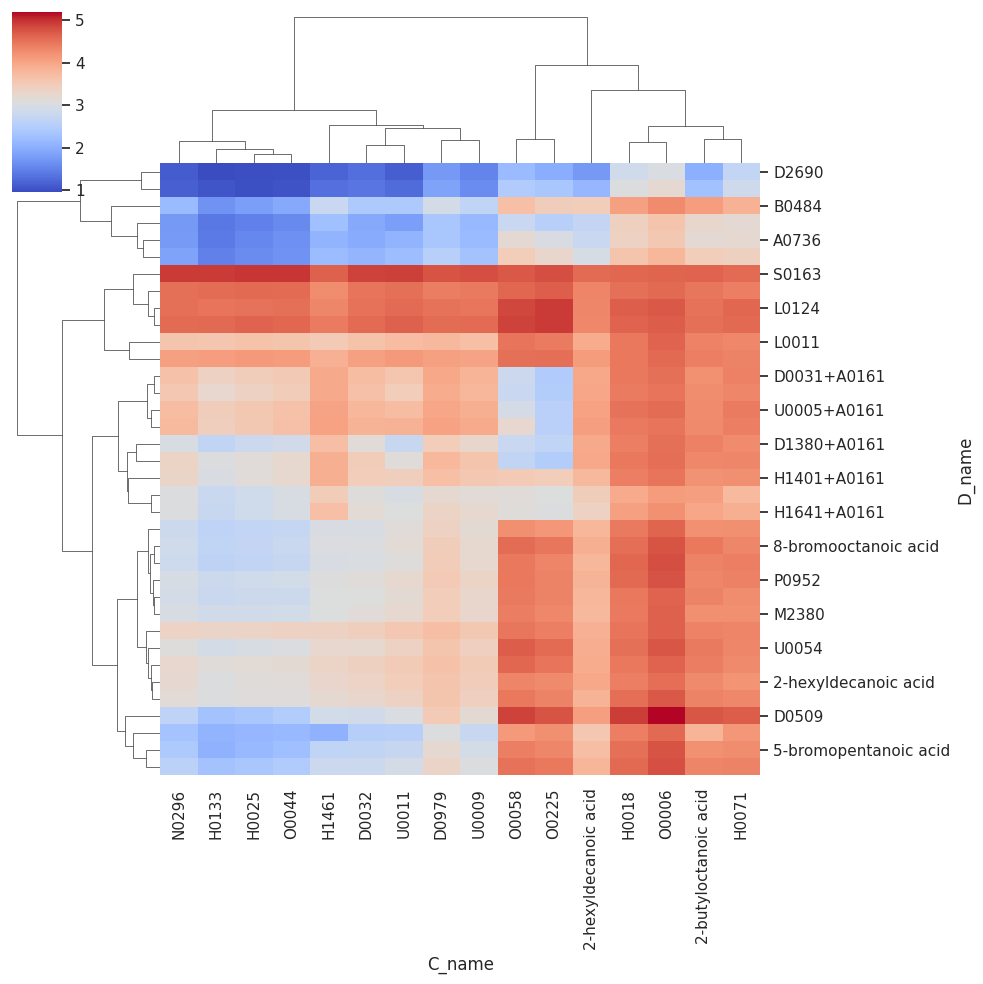

In [ ]:
plt.figure(figsize=(10, 10))
sns.clustermap(compute_matrix("D", "C", "mean"), annot=False, fmt=".2f", cmap='coolwarm',
               )

<Figure size 1000x1000 with 0 Axes>

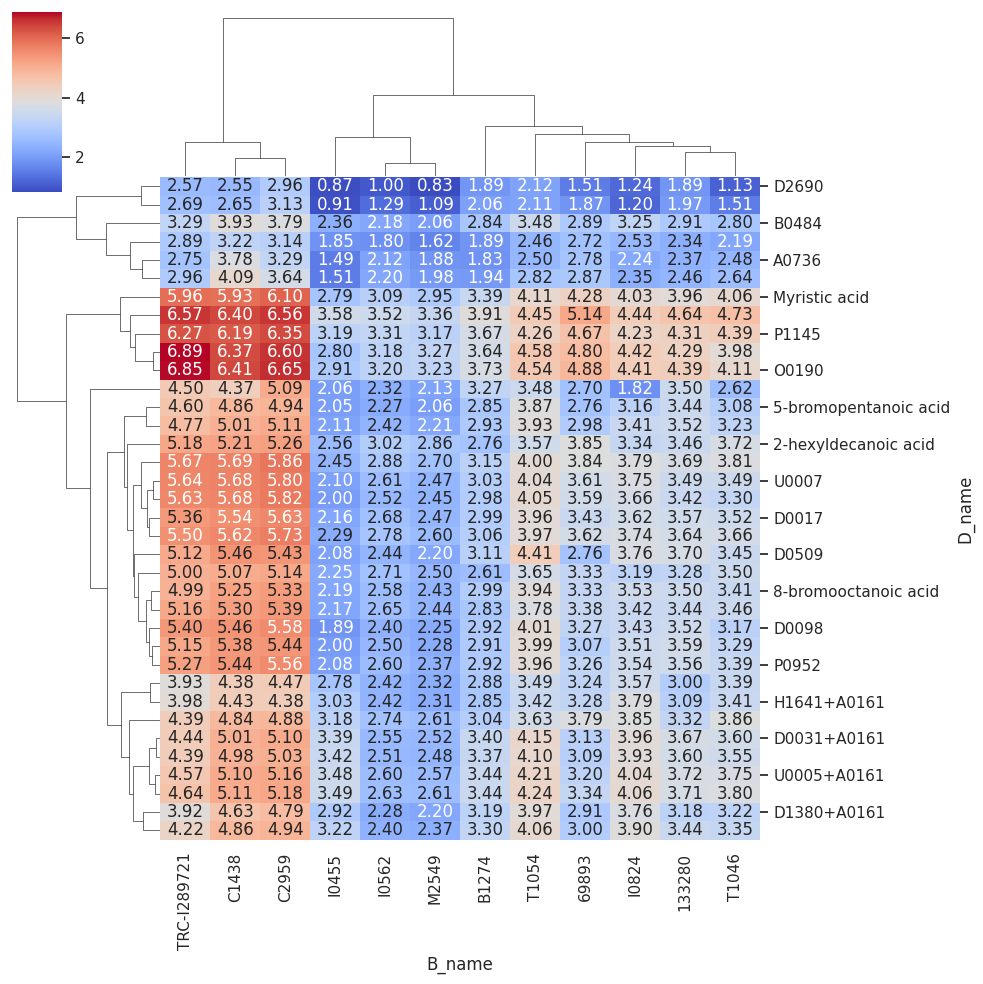

In [ ]:
plt.figure(figsize=(10, 10))
sns.clustermap(compute_matrix("D", "B", "mean"), annot=True, fmt=".2f", cmap='coolwarm')

<Figure size 1000x1000 with 0 Axes>

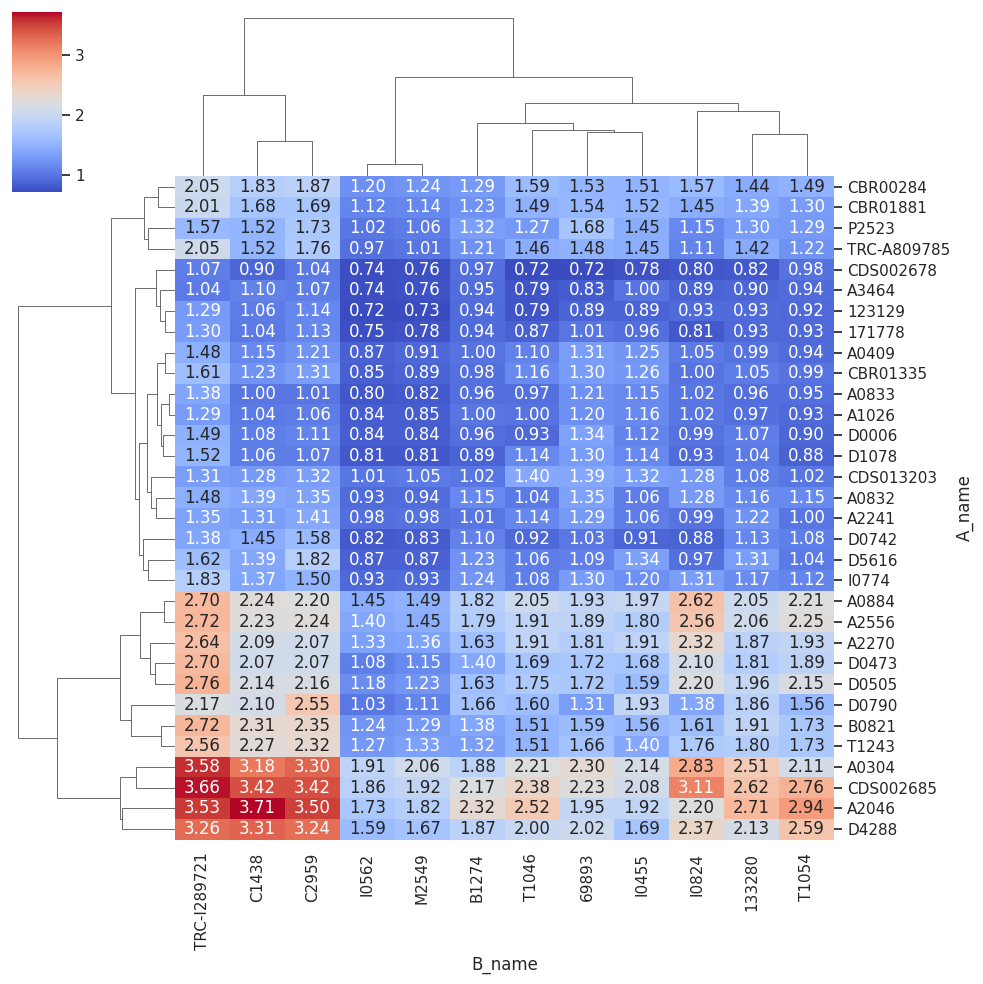

In [ ]:
plt.figure(figsize=(10, 10))
sns.clustermap(compute_matrix("A", "B", "variation"), annot=True, fmt=".2f", cmap='coolwarm')